In [ ]:
#@title dependencies
#pytorch
import torch,torchvision
#Dependencies
!pip install pyyaml==5.1
!gcc --version
!pip install open3d
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'
!pip install -q -U albumentations
!echo "$(pip freeze | grep albumentations) is successfully installed"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp310-cp310-linux_x86_64.whl size=44090 sha256=09ba773a9b7f862622eadddda30d4315e0a20096d81406fc903b781af9ef11d5
  Stored in directory: /root/.cache/pip/wheels/70/83/31/975b737609aba39a4099d471d5684141c1fdc3404f97e7f68a
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.12.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
flax 0.6.9 requires PyYAML>=5.4.1, but you have pyyaml 5.1 which is incompatibl

In [ ]:
#@title imports
import detectron2
import os
import sys
import numpy as np
import json,cv2,random
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
#detectron2 utils
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data import transforms as T
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import inference_on_dataset
from skimage import morphology
from google.colab import drive
import open3d as o3d
import trimesh
import pandas as pd
import numpy as np


drive.mount('/content/gdrive')
#!unzip gdrive/MyDrive/Plant_Root_Training/M3221_Lactuca_WW_Rootrak.zip
image_path = "gdrive/MyDrive/Plant_Root_Training/M3221_Lactuca_WW_Rootrak"

trainAnnotations = "gdrive/MyDrive/Plant_Root_Training/train.json"
valAnnotations = "gdrive/MyDrive/Plant_Root_Training/validate.json"
testAnnotations = "gdrive/MyDrive/Plant_Root_Training/test.json"
#trainAugAnnotations = "gdrive/MyDrive/Plant_Root_Training/small/augmented_train.json"








Mounted at /content/gdrive


In [ ]:
#@title Augmentations

import asyncio
import glob
import json
import random
from itertools import chain
import albumentations as A
import cv2
import numpy as np
from tqdm import tqdm
import nest_asyncio
random.seed(42)

DATASET = 'gdrive/MyDrive/Plant_Root_Training/'
DATASET_OUT = './augmented'
FOLDER_PATH = '{DATASET}/{DATASET_TYPE}.json'
nest_asyncio.apply()

pbar = tqdm()




def coco2albumentations(segmentation):


    return [(segmentation[i], segmentation[i + 1]) for i in range(0, len(segmentation), 2)]


def albumentations2coco(keypoints):


    return list(chain.from_iterable(keypoints))


def coco2cv2(keypoints):


    return np.array([(keypoints[i], keypoints[i + 1]) for i in range(0, len(keypoints), 2)], dtype='int')


def apply_albumentations(image, annotations, image_id, annotation_id, transforms):

    keypoint_kwargs = {
        f"keypoints_{index}": coco2albumentations(anno['segmentation'][0]) for index, anno in enumerate(annotations)
    }

    transform = A.Compose(
        transforms=transforms,
        keypoint_params=A.KeypointParams(format='xy'),
        additional_targets={f"keypoints_{index}": 'keypoints' for index, anno in enumerate(annotations)},
    )
    transformed = transform(image=image, keypoints=[], **keypoint_kwargs)

    new_annos = []
    for anno, keypoint_name in zip(annotations, keypoint_kwargs):
        annotation_id += 1
        keypoints = albumentations2coco(transformed[keypoint_name])
        cv2_keypoints = coco2cv2(keypoints)
        if not keypoints or len(keypoints) <= 4:
            continue
        new_annos.append({
            'id': annotation_id,
            'image_id': image_id,
            'iscrowd': anno['iscrowd'],
            'segmentation': [keypoints],
            'category_id': anno['category_id'],
            'area': cv2.contourArea(cv2_keypoints),
            'bbox': list(cv2.boundingRect(cv2_keypoints)),
        })

    return transformed['image'], new_annos


def process(image, dataset_type, anno, anno_id):
    input_image_path = DATASET+'M3221_Lactuca_WW_Rootrak/'+image["file_name"]
    output_image_path = './augs/'+image["file_name"]

    cv2_image = cv2.imread(filename=input_image_path)

    try:
      img_annotations = list(filter(lambda x: x['image_id'] == image['id'], anno['annotations']))
      if dataset_type == 'validate.json':
       print(image['id'])
      height, width, _ = cv2_image.shape
      transforms = [
          #transforms
          A.HorizontalFlip(always_apply=True),
          A.VerticalFlip(always_apply=True),

      ]

      # start preprocessing
      transformed_image, transformed_keypoints = apply_albumentations(
          image=cv2_image,
          image_id=image['id'],
          transforms=transforms,
          annotation_id=anno_id,
          annotations=img_annotations,
      )

      cv2.imwrite(filename=output_image_path, img=transformed_image)

      if pbar.desc != dataset_type:
          pbar.reset()
          pbar.total = len(anno['images'])
          pbar.desc = dataset_type

      pbar.update(1)
      return transformed_keypoints
    except Exception as e:
      print(e)



async def main():
    anno_id = 0
    for dataset_type in ['train.json']:
      anno_path = DATASET+dataset_type
      print(anno_path)

      with open(anno_path,'r') as f_in:
          anno = json.load(f_in)
          try:
            tasks = [
                asyncio.to_thread(process, image=image, dataset_type=dataset_type, anno=anno, anno_id=anno_id)
                for image in anno['images']
            ]
            results = await asyncio.gather(*tasks)
            new_annos = list(chain.from_iterable(results))
            with open("train_augmented.json", 'w') as f_out:
              i = 0
              new_anns = []
              for ann in new_annos:
                ann["id"] = i
                new_anns.append(ann)
                i+=1
              anno['annotations'] = new_annos
              json.dump(anno, f_out)
          except Exception as e:
            print(e)
if __name__ == '__main__':
    asyncio.run(main())



0it [00:00, ?it/s]
0it [00:00, ?it/s]
train.json: 100%|██████████| 187/187 [00:59<00:00,  3.17it/s]


gdrive/MyDrive/Plant_Root_Training/train.json



train.json:  97%|█████████▋| 181/187 [00:05<00:00, 39.05it/s]

In [ ]:

#@title remove small instances
trainAugAnnotations = "./train_augmented.json"

for annotation in [trainAnnotations, trainAugAnnotations,valAnnotations,testAnnotations]:
  new_anns = []
  with open(annotation,'r') as f:
    print(annotation)
    anns = json.load(f)
    an = anns['annotations']
    for ann in an:
      if ann["area"]>600:
        new_anns.append(ann)
    anns['annotations'] = new_anns
    if annotation == "./train_augmented.json":
      with open(annotation, 'w') as u:
        json.dump(anns, u)
    else:
      with open(annotation[35:], 'w') as u:
        json.dump(anns, u)
trainAnnotations = "./train.json"
valAnnotations = "./validate.json"
testAnnotations = "./test.json"


gdrive/MyDrive/Plant_Root_Training/train.json
./train_augmented.json
gdrive/MyDrive/Plant_Root_Training/validate.json
gdrive/MyDrive/Plant_Root_Training/test.json


In [ ]:
#@title register datasets
trainAugAnnotations = "./train_augmented.json"
register_coco_instances("train", {}, trainAnnotations, image_path)
register_coco_instances("val", {}, valAnnotations, image_path)
register_coco_instances("test", {}, testAnnotations, image_path)
register_coco_instances("train_aug", {}, trainAugAnnotations, './augs')



Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



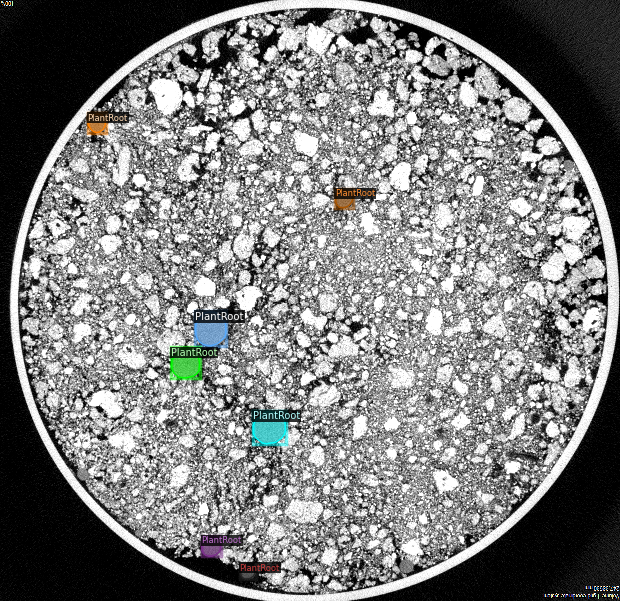

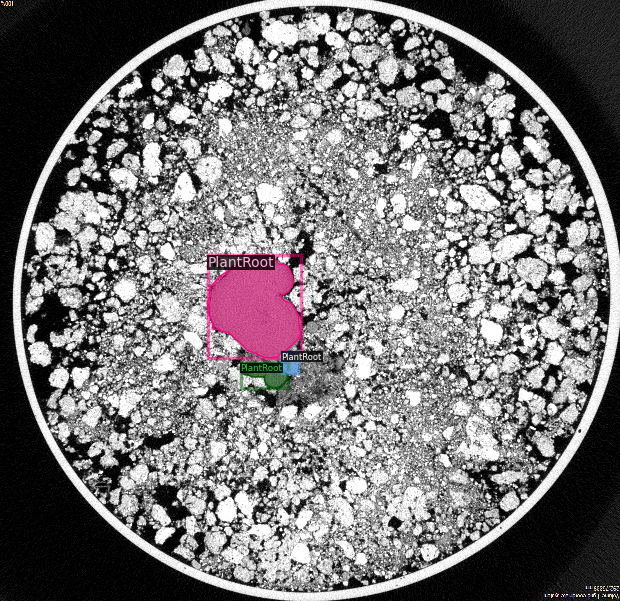

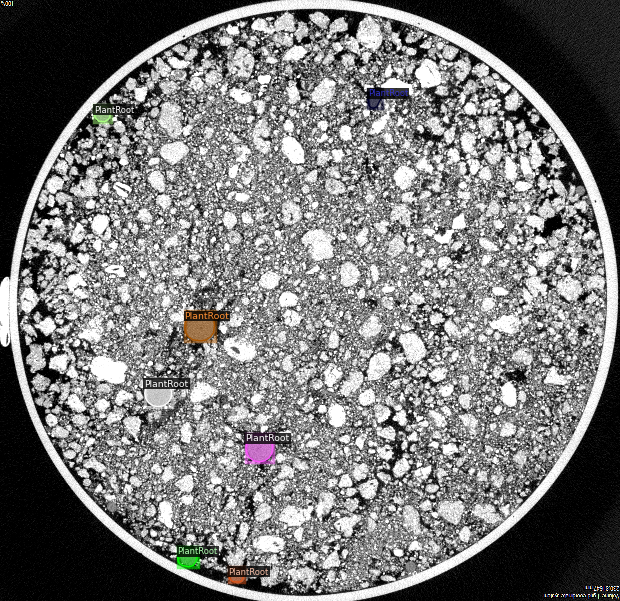

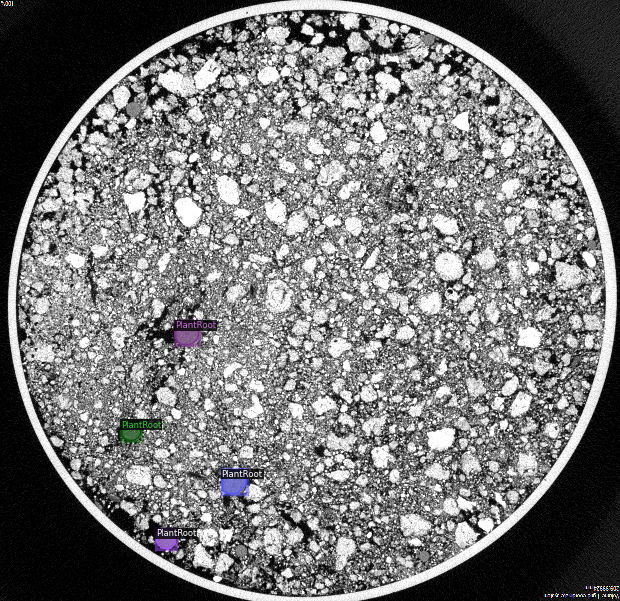

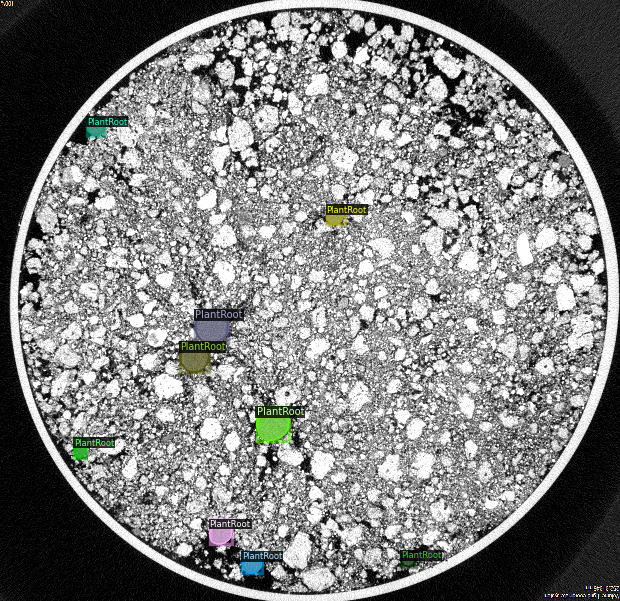

In [ ]:
#@title Vis train
#change "train" to one of the other datasets to visualise them
dataset_dicts = DatasetCatalog.get("train_aug")
root_metadata = MetadataCatalog.get("train_aug")

import random
from detectron2.utils.visualizer import Visualizer
i = 0
for d in random.sample(dataset_dicts,5):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=root_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])




In [ ]:
#@title calculate validation loss
from detectron2.engine.hooks import HookBase
from detectron2.evaluation import inference_context
from detectron2.utils.logger import log_every_n_seconds
from detectron2.data import DatasetMapper, build_detection_test_loader
import detectron2.utils.comm as comm
import torch
import time
import datetime

class LossEvalHook(HookBase):
    def __init__(self, eval_period, model, data_loader):
        self._model = model
        self._period = eval_period
        self._data_loader = data_loader

    def _do_loss_eval(self):
        # Copying inference_on_dataset from evaluator.py
        total = len(self._data_loader)
        num_warmup = min(5, total - 1)

        start_time = time.perf_counter()
        total_compute_time = 0
        losses = []
        for idx, inputs in enumerate(self._data_loader):
            if idx == num_warmup:
                start_time = time.perf_counter()
                total_compute_time = 0
            start_compute_time = time.perf_counter()
            if torch.cuda.is_available():
                torch.cuda.synchronize()
            total_compute_time += time.perf_counter() - start_compute_time
            iters_after_start = idx + 1 - num_warmup * int(idx >= num_warmup)
            seconds_per_img = total_compute_time / iters_after_start
            if idx >= num_warmup * 2 or seconds_per_img > 5:
                total_seconds_per_img = (time.perf_counter() - start_time) / iters_after_start
                eta = datetime.timedelta(seconds=int(total_seconds_per_img * (total - idx - 1)))
                log_every_n_seconds(
                    logging.INFO,
                    "Loss on Validation  done {}/{}. {:.4f} s / img. ETA={}".format(
                        idx + 1, total, seconds_per_img, str(eta)
                    ),
                    n=5,
                )
            loss_batch = self._get_loss(inputs)
            losses.append(loss_batch)
        mean_loss = np.mean(losses)
        self.trainer.storage.put_scalar('validation_loss', mean_loss)
        comm.synchronize()

        return losses

    def _get_loss(self, data):
        # How loss is calculated on train_loop
        metrics_dict = self._model(data)
        metrics_dict = {
            k: v.detach().cpu().item() if isinstance(v, torch.Tensor) else float(v)
            for k, v in metrics_dict.items()
        }
        total_losses_reduced = sum(loss for loss in metrics_dict.values())
        return total_losses_reduced


    def after_step(self):
        next_iter = self.trainer.iter + 1
        is_final = next_iter == self.trainer.max_iter
        if is_final or (self._period > 0 and next_iter % self._period == 0):
            self._do_loss_eval()
        self.trainer.storage.put_scalars(timetest=12)

In [ ]:
#@title custom trainer
#implements the validation loss
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data.dataset_mapper import DatasetMapper
from detectron2.data import build_detection_train_loader

class MyTrainer(DefaultTrainer):
    @classmethod
    def build_train_loader(cls, cfg):
      mapper=DatasetMapper(cfg, is_train=True,)
      return build_detection_train_loader(cfg,mapper=mapper)
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR,"inference")
        return COCOEvaluator(dataset_name, cfg, True, output_folder)
    def build_hooks(self):
            hooks = super().build_hooks()
            hooks.insert(-1,LossEvalHook(
                cfg.TEST.EVAL_PERIOD,
                self.model,
                build_detection_test_loader(
                    self.cfg,
                    self.cfg.DATASETS.TEST[0],
                    DatasetMapper(self.cfg,True)
                )
            ))
            return hooks

In [ ]:
#@title custom trainer for subset of data
#@title custom trainer
#implements the validation loss
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data.dataset_mapper import DatasetMapper
from detectron2.data import build_detection_train_loader
from detectron2.data.samplers import RandomSubsetTrainingSampler
class SubsetTrainer(DefaultTrainer):
    @classmethod
    def build_train_loader(cls, cfg):
      mapper=DatasetMapper(cfg, is_train=True,)
      subset_sampler = RandomSubsetTrainingSampler(374, 0.1,False,42)
      return build_detection_train_loader(cfg,mapper=mapper,sampler=subset_sampler)

    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR,"inference")
        return COCOEvaluator(dataset_name, cfg, True, output_folder)

    def build_hooks(self):
            hooks = super().build_hooks()
            hooks.insert(-1,LossEvalHook(
                cfg.TEST.EVAL_PERIOD,
                self.model,
                build_detection_test_loader(
                    self.cfg,
                    self.cfg.DATASETS.TEST[0],
                    DatasetMapper(self.cfg,True)
                )
            ))
            return hooks

In [ ]:
#@title train
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.evaluation import COCOEvaluator
import os
import logging

cfg = get_cfg()
cfg.merge_from_file(
    model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
    #model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")
)
cfg.DATASETS.TRAIN = ("train","train_aug",)
cfg.DATASETS.TEST = ("val",)
cfg.TEST.EVAL_PERIOD = 100
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0002
cfg.SOLVER.WARMUP_ITERS = 300
cfg.SOLVER.WARMUP_FACTOR = 1 /300
cfg.SOLVER.CHECKPOINT_PERIOD = 500

cfg.POST_NMS_TOPK_TEST = 3000
cfg.POST_NMS_TOPK_TRAIN = 6000


cfg.SOLVER.MAX_ITER = (
    3000
)
#cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (
    128
)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
print(cfg.dump())
with open("mask_rcnn_R_50_FPN_3x_my_dataset.yaml", "w") as f:
    f.write(cfg.dump())
trainer = MyTrainer(cfg)
#trainer = SubsetTrainer(cfg)
trainer.train()

CUDNN_BENCHMARK: false
DATALOADER:
  ASPECT_RATIO_GROUPING: true
  FILTER_EMPTY_ANNOTATIONS: true
  NUM_WORKERS: 2
  REPEAT_THRESHOLD: 0.0
  SAMPLER_TRAIN: TrainingSampler
DATASETS:
  PRECOMPUTED_PROPOSAL_TOPK_TEST: 1000
  PRECOMPUTED_PROPOSAL_TOPK_TRAIN: 2000
  PROPOSAL_FILES_TEST: []
  PROPOSAL_FILES_TRAIN: []
  TEST:
  - val
  TRAIN:
  - train
  - train_aug
GLOBAL:
  HACK: 1.0
INPUT:
  CROP:
    ENABLED: false
    SIZE:
    - 0.9
    - 0.9
    TYPE: relative_range
  FORMAT: BGR
  MASK_FORMAT: polygon
  MAX_SIZE_TEST: 1333
  MAX_SIZE_TRAIN: 1333
  MIN_SIZE_TEST: 800
  MIN_SIZE_TRAIN:
  - 640
  - 672
  - 704
  - 736
  - 768
  - 800
  MIN_SIZE_TRAIN_SAMPLING: choice
  RANDOM_FLIP: horizontal
MODEL:
  ANCHOR_GENERATOR:
    ANGLES:
    - - -90
      - 0
      - 90
    ASPECT_RATIOS:
    - - 0.5
      - 1.0
      - 2.0
    NAME: DefaultAnchorGenerator
    OFFSET: 0.0
    SIZES:
    - - 32
    - - 64
    - - 128
    - - 256
    - - 512
  BACKBONE:
    FREEZE_AT: 2
    NAME: build_resnet_fp

In [ ]:
import gc
torch.cuda.empty_cache()

gc.collect()


34839

In [ ]:
#@title tensorboard
%reload_ext tensorboard
%tensorboard --logdir gdrive/MyDrive/output1305

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
2023-05-13 20:18:20.198854: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.33' not found (required by /usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server)
/usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.34' not found (required by /usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server)
/usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.32' not found (required by /usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server)
Address already in use
Port 6006 is in use by another program. Either identify and stop that program, or start the s

In [ ]:
#if tensorboard stops working
!lsof -i :6006

In [ ]:
#change #pid to pid of tensorboard process for ex. !kill 9 3609
!kill 9 #pid

In [ ]:
#@title quick evaluation
cfg = trainer.cfg
#cfg.merge_from_file("gdrive/MyDrive/output1305/mask_rcnn_R_50_FPN_3x_my_dataset.yaml")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = "gdrive/MyDrive/output1305/model_final.pth"

# Create predictor
predictor = DefaultPredictor(cfg)

#Call the COCO Evaluator function and pass the Validation Dataset
evaluator = COCOEvaluator("test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "test")

#Use the created predicted model in the previous step
inference = inference_on_dataset(predictor.model, val_loader, evaluator)

[05/13 20:17:37 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from gdrive/MyDrive/output1305/model_final.pth ...
WARNING [05/13 20:17:37 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [05/13 20:17:37 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/13 20:17:37 d2.data.datasets.coco]: Loaded 22 images in COCO format from ./test.json
[05/13 20:17:37 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
| PlantRoot  | 132          |
|            |              |
[05/13 20:17:37 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/13 20:17:37 d2.data.common]: Serializing the dataset using: <class 'detectron2.dat

WARNING [05/13 20:22:59 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/13 20:22:59 d2.data.datasets.coco]: Loaded 22 images in COCO format from ./test.json
gdrive/MyDrive/Plant_Root_Training/M3221_Lactuca_WW_Rootrak/M3221_Lactuca_WW1167.bmp


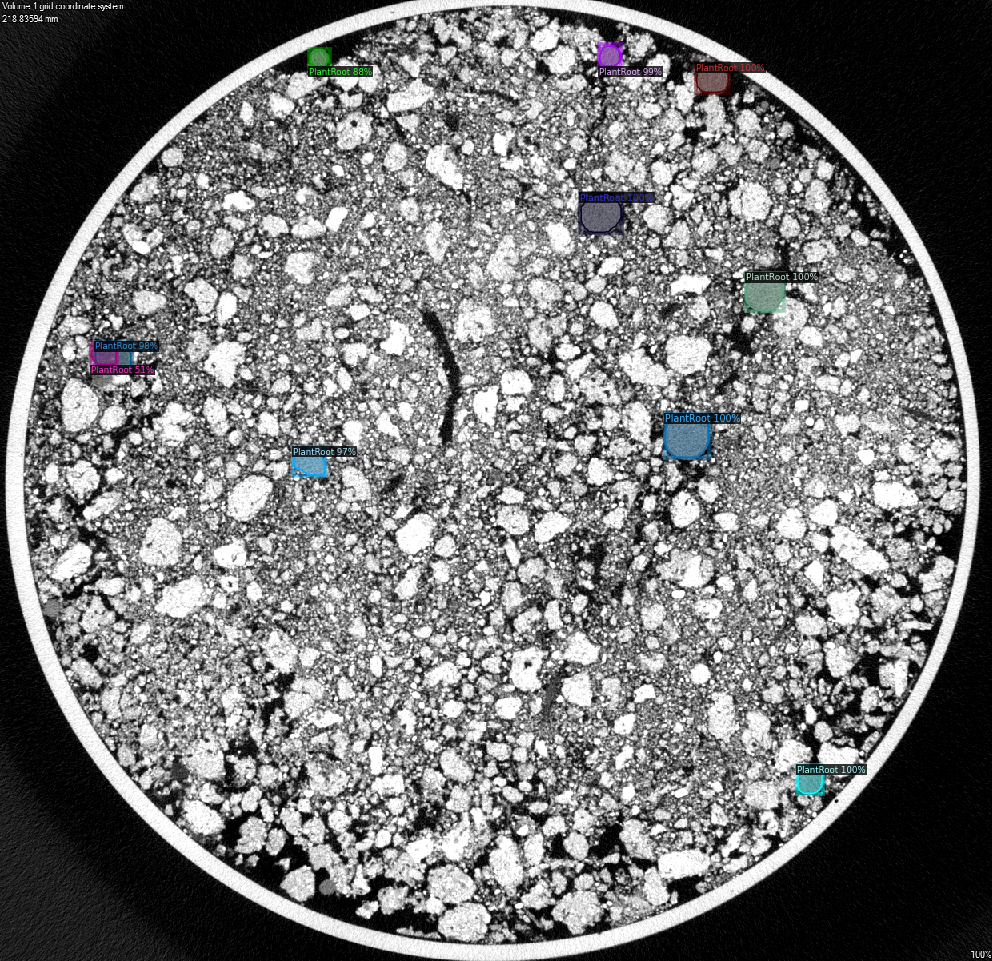

gdrive/MyDrive/Plant_Root_Training/M3221_Lactuca_WW_Rootrak/M3221_Lactuca_WW1118.bmp


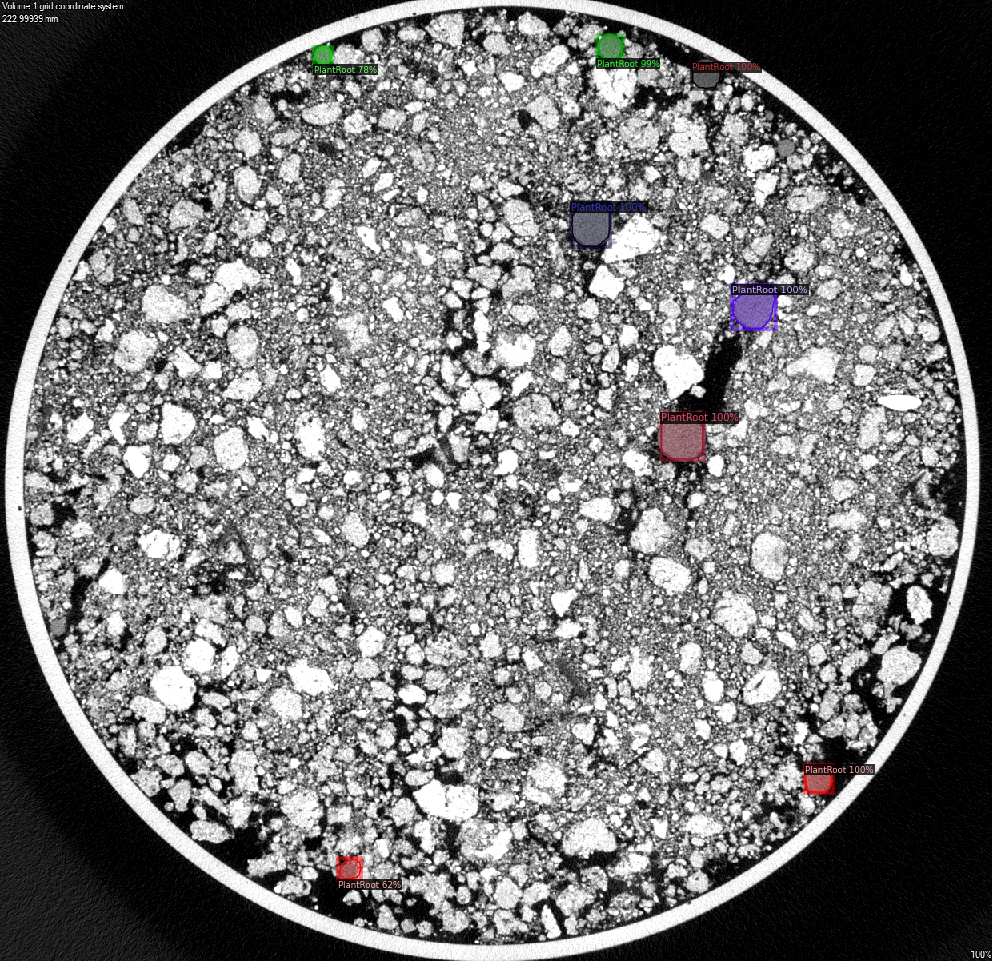

gdrive/MyDrive/Plant_Root_Training/M3221_Lactuca_WW_Rootrak/M3221_Lactuca_WW1254.bmp


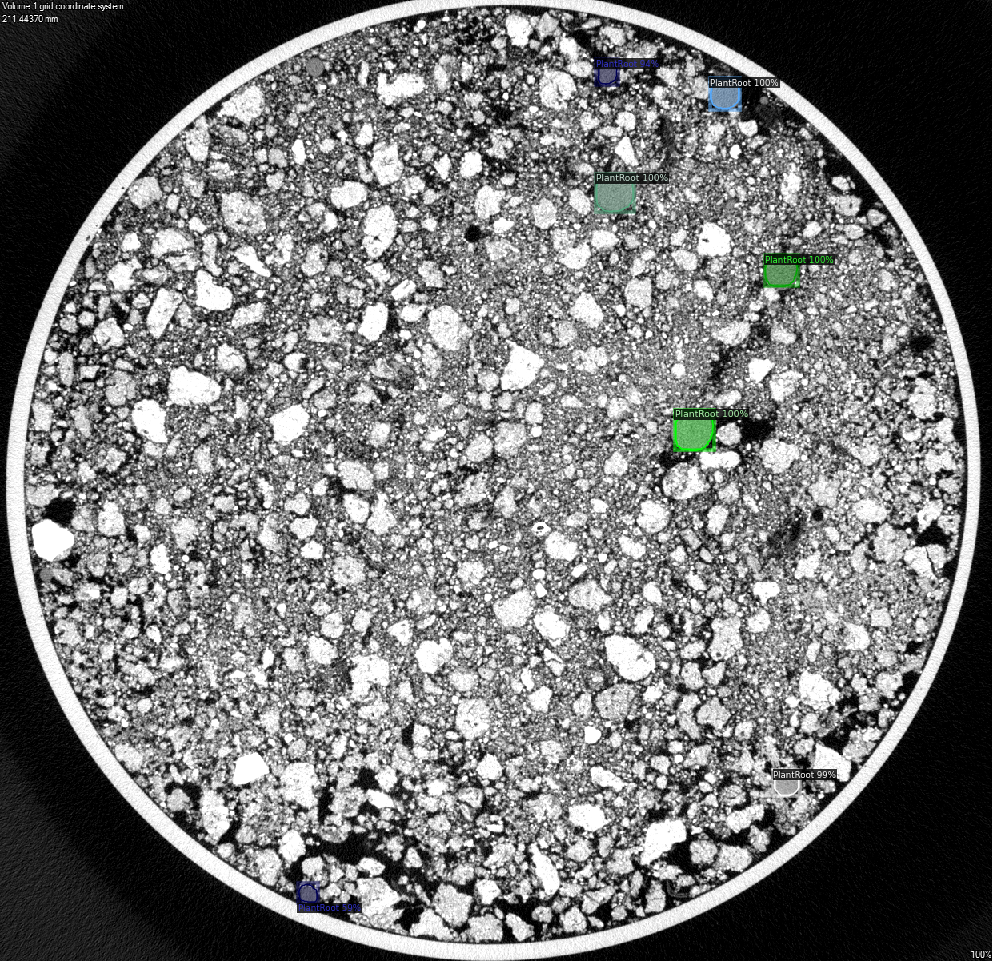

gdrive/MyDrive/Plant_Root_Training/M3221_Lactuca_WW_Rootrak/M3221_Lactuca_WW0650.bmp


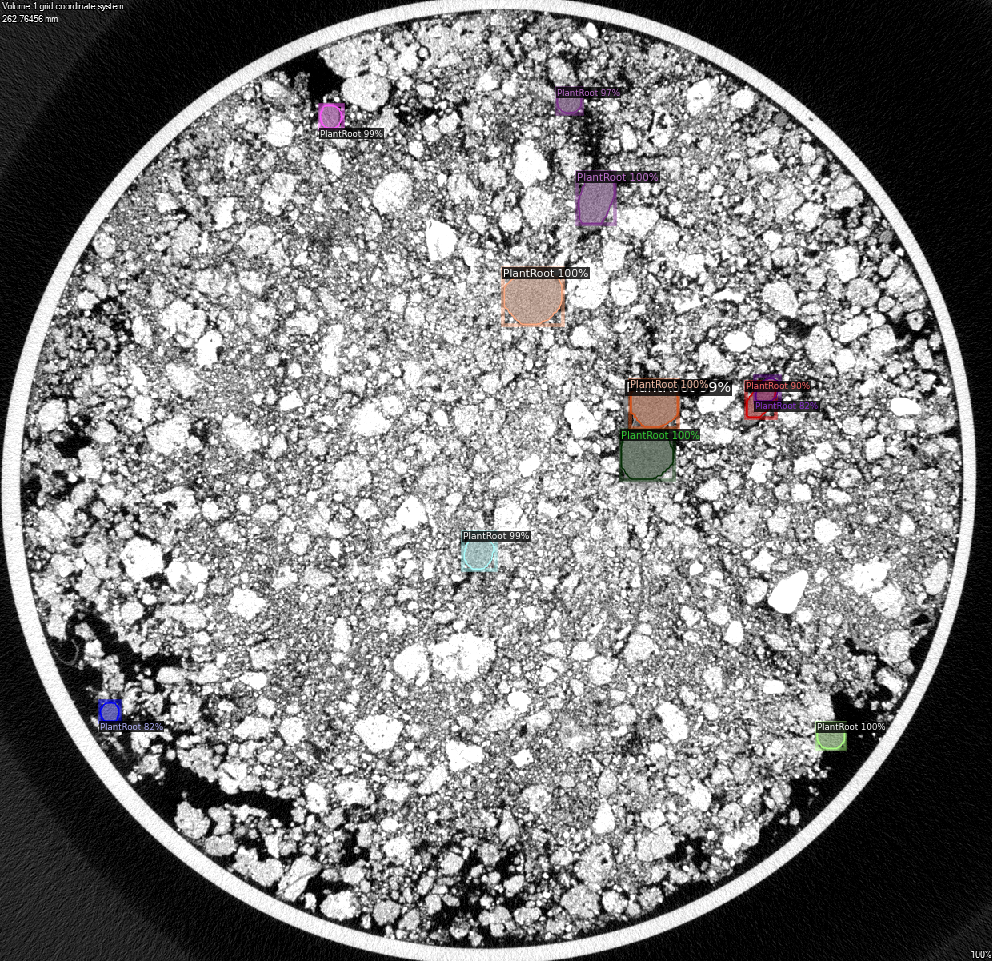

gdrive/MyDrive/Plant_Root_Training/M3221_Lactuca_WW_Rootrak/M3221_Lactuca_WW1229.bmp


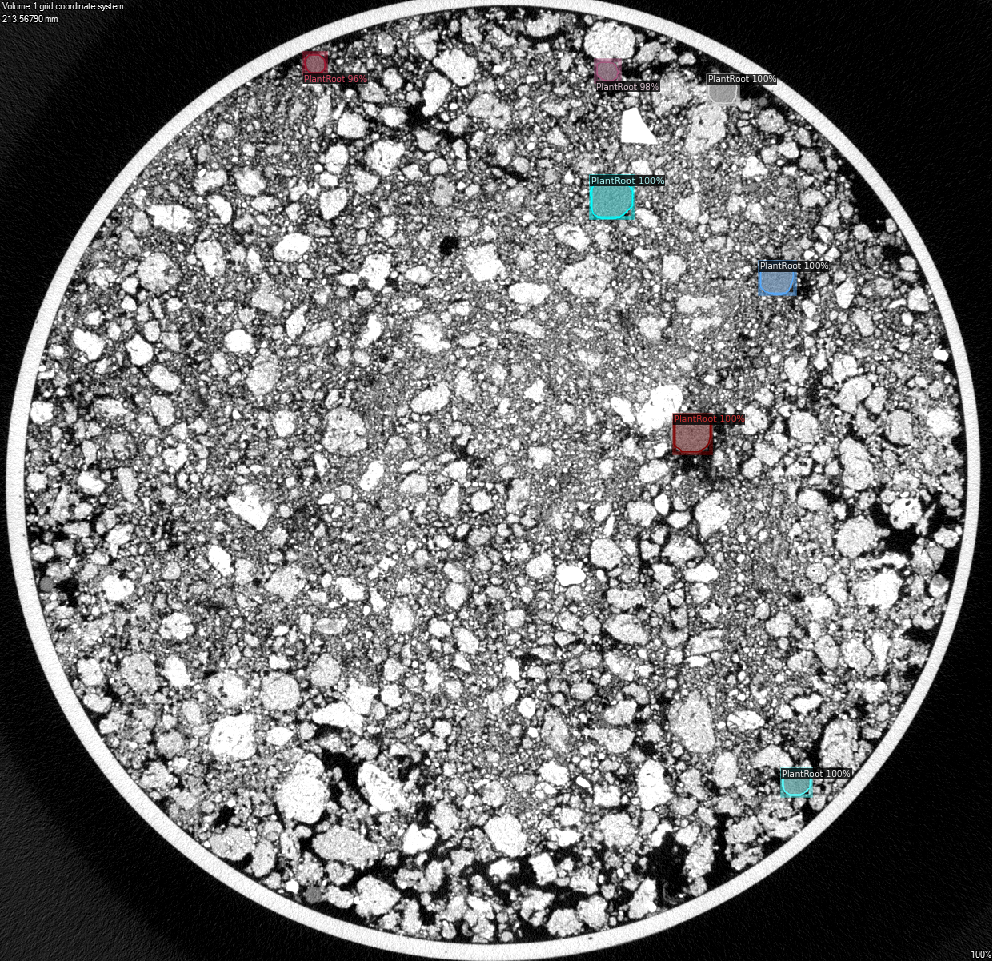

In [ ]:
#@title vis predictions
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("test")
root_metadata = MetadataCatalog.get("test")
for d in random.sample(dataset_dicts, 5):
    im = cv2.imread(d["file_name"])
    print(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=root_metadata,
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
ls = list(os.listdir(image_path))
ls.remove('images_bin.dat')

In [ ]:
print(zdata)

[896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88, 896.88,

In [ ]:
#@title Saving the instance predictions from trained model and saving to csv, ready for reconstruction
from detectron2.data.catalog import MetadataCatalog
from google.colab.patches import cv2_imshow
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from google.colab import drive
import matplotlib.pyplot as plt
from detectron2.structures import BitMasks, Boxes, BoxMode, Keypoints, PolygonMasks, RotatedBoxes
import pycocotools.mask as mask_util
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.visualizer import GenericMask
xdata = []
ydata = []
zdata = []
z = 0
i=0
id = 1
related_instances = []
for img in sorted(ls,reverse=True):


    im = cv2.imread("gdrive/MyDrive/Plant_Root_Training/M3221_Lactuca_WW_Rootrak/"+img)
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   MetadataCatalog.get(cfg.DATASETS.TRAIN[0]),
                   scale=1,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    try:
      out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
      w = outputs["instances"].to("cpu")
      masks = np.asarray(w.pred_masks)
      instances_in_image = {"id":id}




      for mask in masks:

          x = GenericMask(mask, out.height, out.width)
          bbox = x.bbox()
          x = x.mask_to_polygons(mask)
          data = np.asarray(x[0])[0]
          instances_in_image[]

          for i in list(range(0,len(data))):
            if i%2==0:

              xdata.append(data[i])
            else:
              ydata.append(data[i])

              zdata.append(0.24*int(img[16:20]))
          id+=1

    except:
      i+=1
      continue
print(i)
df = pd.DataFrame([],columns=["x","y","z"])
df["x"]=xdata
df["y"]=ydata
df["z"]=zdata
df.to_csv("RootSystem.csv")

<ipython-input-86-61d3601528d9>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data = np.asarray(x[0])[0]
<ipython-input-86-61d3601528d9>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data = np.asarray(x[0])[0]
<ipython-input-86-61d3601528d9>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data = np.asarray(x[0])[0]
<ipytho

In [ ]:
#@title reconstruction and visualisation
df = pd.read_csv("RootSystem.csv")
xdata = list(df["x"])
ydata = list(df["y"])
zdata = list(df["z"])

pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(points)
o3d.io.write_point_cloud("root_cloud.ply", pcd)
pcd = o3d.io.read_point_cloud("./root_cloud.ply")
points = []


for i in range(len(xdata)):
  points.append([xdata[i],ydata[i],zdata[i]])

pcd.estimate_normals()
#pcd.orient_normals_consistent_tangent_plane(100)

voxel_down_pcd = pcd.voxel_down_sample(voxel_size=0.02)


# estimate radius for rolling ball
distances = voxel_down_pcd.compute_nearest_neighbor_distance()
avg_dist = np.mean(distances)
print(avg_dist)
radius = 3 * avg_dist

mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_ball_pivoting(
           voxel_down_pcd,
           o3d.utility.DoubleVector([radius, radius * 2]))

# create the triangular mesh with the vertices and faces from open3d
tri_mesh = trimesh.Trimesh(np.asarray(mesh.vertices), np.asarray(mesh.triangles),
                          vertex_normals=np.asarray(mesh.vertex_normals))

trimesh.convex.is_convex(tri_mesh)